Problem Statement
Dota 2 is an online computer game played by two teams of five players each, with the ultimate goal being to destroy a specific structure in the enemy team's base. My goal is to use data from a Kaggle Dota 2 Competition (https://www.kaggle.com/c/mlcourse-dota2-win-prediction/data) to create a random forest classifier that can predict which team will win. 

In [ ]:
import pandas as pd
import matplotlib as mpl
from matplotlib import cm
import matplotlib.pyplot as plt
import numpy as np
import math
import seaborn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [ ]:
#data from Kaggle Dota 2 Competition:
#https://www.kaggle.com/c/mlcourse-dota2-win-prediction/data

df = pd.read_csv('https://raw.githubusercontent.com/obbrown1/IntroMachineLearning/067d105499d19180b0cdff9e5ec158b605566e72/train%20data%20all.csv')
print(df.info())
print(df.head())
for c in df.columns:
    print (c)
    
#24 columns for each player x 10 players (r1-5, d1-5)
#target column - radiant_win

In [4]:
#count null values by column and by type of null
nulls = [np.nan, None, [], {}]
for c in df.columns:
    string_null = np.array([x in nulls for x in df[c]])
    print(c, df[c].isnull().sum(), string_null.sum()) 

match_id_hash 0 0
game_time 0 0
game_mode 0 0
lobby_type 0 0
objectives_len 0 0
chat_len 0 0
r1_hero_id 0 0
r1_kills 0 0
r1_deaths 0 0
r1_assists 0 0
r1_denies 0 0
r1_gold 0 0
r1_lh 0 0
r1_xp 0 0
r1_health 0 0
r1_max_health 0 0
r1_max_mana 0 0
r1_level 0 0
r1_x 0 0
r1_y 0 0
r1_stuns 0 0
r1_creeps_stacked 0 0
r1_camps_stacked 0 0
r1_rune_pickups 0 0
r1_firstblood_claimed 0 0
r1_teamfight_participation 0 0
r1_towers_killed 0 0
r1_roshans_killed 0 0
r1_obs_placed 0 0
r1_sen_placed 0 0
r2_hero_id 0 0
r2_kills 0 0
r2_deaths 0 0
r2_assists 0 0
r2_denies 0 0
r2_gold 0 0
r2_lh 0 0
r2_xp 0 0
r2_health 0 0
r2_max_health 0 0
r2_max_mana 0 0
r2_level 0 0
r2_x 0 0
r2_y 0 0
r2_stuns 0 0
r2_creeps_stacked 0 0
r2_camps_stacked 0 0
r2_rune_pickups 0 0
r2_firstblood_claimed 0 0
r2_teamfight_participation 0 0
r2_towers_killed 0 0
r2_roshans_killed 0 0
r2_obs_placed 0 0
r2_sen_placed 0 0
r3_hero_id 0 0
r3_kills 0 0
r3_deaths 0 0
r3_assists 0 0
r3_denies 0 0
r3_gold 0 0
r3_lh 0 0
r3_xp 0 0
r3_health 0 0
r3

match_id_hash          0
game_time              0
game_mode              0
lobby_type             0
objectives_len         0
                    ... 
game_time.1            0
radiant_win            0
duration               0
time_remaining         0
next_roshan_team    3489
Length: 251, dtype: int64


(array([250.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([   0. ,  348.9,  697.8, 1046.7, 1395.6, 1744.5, 2093.4, 2442.3,
        2791.2, 3140.1, 3489. ]),
 <a list of 10 Patch objects>)

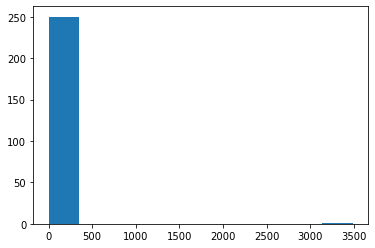

In [5]:
#count and plot null totals
#the plot shows that all columns but one have 0 null values
null_count = df.isnull().sum(axis=0)
print(null_count)
plt.hist(null_count)

In [6]:
#next_roshan_team is the column with nulls, which is fine since that won't be part of the analysis
#drop duplicate game_time column
#drop unnecessary match id column
df = df.drop('next_roshan_team', axis = 1)
df = df.drop('game_time.1', axis = 1)
df.reset_index()
df = df.drop('match_id_hash', axis = 1)

(array([  0.,   0.,   0.,   0.,   0., 249.,   0.,   0.,   0.,   0.]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5]),
 <a list of 10 Patch objects>)

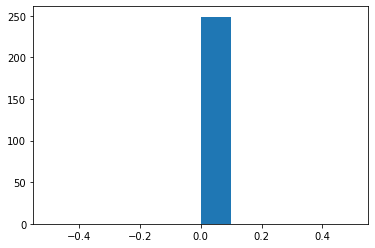

In [7]:
#plot null counts again, showing all columns with 0 nulls
null_count = df.isnull().sum(axis=0)
plt.hist(null_count)

In [121]:
#sum number of wins and losses for all heroes in the data set

print("Overall Radiant win %")
print(sum(df['radiant_win'] == True) / len(df['radiant_win']))

print(df.iloc[1])

hero_stats = {}
for i in range(len(df)):
    
    if df.iloc[i]['radiant_win'] == True:
        winning_heroes = [df.iloc[i]['r1_hero_id'], df.iloc[i]['r2_hero_id'],df.iloc[i]['r3_hero_id'],df.iloc[i]['r4_hero_id'],df.iloc[i]['r5_hero_id']] 
        losing_heroes = [df.iloc[i]['d1_hero_id'], df.iloc[i]['d2_hero_id'],df.iloc[i]['d3_hero_id'],df.iloc[i]['d4_hero_id'],df.iloc[i]['d5_hero_id']]
    else:
        losing_heroes = [df.iloc[i]['r1_hero_id'], df.iloc[i]['r2_hero_id'],df.iloc[i]['r3_hero_id'],df.iloc[i]['r4_hero_id'],df.iloc[i]['r5_hero_id']] 
        winning_heroes = [df.iloc[i]['d1_hero_id'], df.iloc[i]['d2_hero_id'],df.iloc[i]['d3_hero_id'],df.iloc[i]['d4_hero_id'],df.iloc[i]['d5_hero_id']]

    for h in winning_heroes:
        if h in hero_stats:
            hero_stats[h][0] += 1
        else:
            hero_stats[h] = [1,0]
            
    for h in losing_heroes:
        if h in hero_stats:
            hero_stats[h][1] += 1
        else:
            hero_stats[h] = [1,1]

Overall Radiant win %
0.5204193709435846
game_time          658
game_mode            4
lobby_type           0
objectives_len       3
chat_len            10
                  ... 
d5_obs_placed        0
d5_sen_placed        0
radiant_win       True
duration          1154
time_remaining     496
Name: 1, Length: 248, dtype: object
{12: [606, 638], 21: [660, 761], 60: [188, 170], 84: [433, 449], 34: [479, 518], 11: [1372, 1467], 78: [171, 172], 14: [2050, 2034], 59: [464, 411], 77: [215, 214], 15: [205, 242], 96: [214, 191], 27: [783, 707], 63: [336, 338], 89: [121, 139], 58: [146, 183], 1: [418, 516], 56: [519, 398], 92: [233, 146], 101: [498, 486], 51: [460, 406], 44: [816, 894], 49: [541, 508], 53: [380, 467], 18: [432, 426], 67: [352, 245], 47: [492, 505], 40: [469, 497], 17: [452, 461], 99: [773, 700], 26: [575, 638], 41: [915, 833], 98: [307, 377], 8: [1248, 1130], 69: [436, 404], 86: [746, 875], 23: [597, 634], 22: [805, 575], 35: [937, 874], 72: [358, 439], 42: [874, 744], 104: [61

In [159]:
#load in hero_names spreadsheet to map hero ids to hero names
#calculate win / loss statistics for heroes in data set
names = pd.read_csv('https://raw.githubusercontent.com/obbrown1/IntroMachineLearning/delete/hero_names.csv')

print (names.head())

most_played = (0,0)
best_ratio = (0,0)
worst_ratio = (0,1)

for h in hero_stats:
    games = hero_stats[h][0] + hero_stats[h][1]
    if games > most_played[1]:
        most_played = (h, games)
    ratio = hero_stats[h][0] / games
    if ratio > best_ratio[1] and games > 10:
        best_ratio = (h, ratio)
    if ratio < worst_ratio[1] and games > 10:
        worst_ratio = (h, ratio)
        
mp_hero = names['localized_name'][most_played[0]]
br_hero = names['localized_name'][best_ratio[0]]
wr_hero = names['localized_name'][worst_ratio[0]]

print (f'\nMost games played \n Hero: {mp_hero} \n Games: {most_played[1]}\n')
print (f'Best Ratio (>10 games played)\n Hero: {br_hero} \n Games: {best_ratio[1]}\n')
print (f'Worst Ratio (>10 games played)\n Hero: {wr_hero} \n Games: {worst_ratio[1]}\n')
print (f'Total unique heroes played: {len(hero_stats)}')
    

                           name  hero_id  localized_name
0        npc_dota_hero_antimage        1       Anti-Mage
1             npc_dota_hero_axe        2             Axe
2            npc_dota_hero_bane        3            Bane
3     npc_dota_hero_bloodseeker        4     Bloodseeker
4  npc_dota_hero_crystal_maiden        5  Crystal Maiden

Most games played 
 Hero: Razor 
 Games: 4084

Best Ratio (>10 games played)
 Hero: Medusa 
 Games: 0.6147757255936676

Worst Ratio (>10 games played)
 Hero: Vengeful Spirit 
 Games: 0.39081885856079407

Total unique heroes played: 115


In [8]:
#correlation matrix for main data set
df.corr()

,game_time,game_mode,lobby_type,objectives_len,chat_len,r1_hero_id,r1_kills,r1_deaths,r1_assists,r1_denies,...,d5_rune_pickups,d5_firstblood_claimed,d5_teamfight_participation,d5_towers_killed,d5_roshans_killed,d5_obs_placed,d5_sen_placed,radiant_win,duration,time_remaining
game_time,1.000000,-0.014031,0.054961,0.889429,0.292648,0.010485,0.640465,0.748080,0.768929,0.255570,...,0.638918,0.024497,0.338586,0.396323,0.208060,0.337892,0.310166,-0.025284,0.422720,-0.621973
game_mode,-0.014031,1.000000,0.297274,-0.003492,0.011542,-0.010417,-0.002486,0.002671,0.009369,0.023103,...,-0.009521,-0.007064,-0.003892,-0.002832,0.011290,0.014980,0.022502,-0.000429,-0.019764,-0.003225
lobby_type,0.054961,0.297274,1.000000,0.007500,0.000885,0.017126,0.016046,0.027316,0.043533,0.068176,...,0.045727,0.000630,0.032509,0.017659,0.021685,0.055192,0.060131,-0.011445,0.112835,0.043234
objectives_len,0.889429,-0.003492,0.007500,1.000000,0.287888,0.016095,0.601877,0.693628,0.737302,0.188125,...,0.555078,0.017486,0.285800,0.423601,0.237527,0.298078,0.286106,-0.017575,0.268162,-0.646358
chat_len,0.292648,0.011542,0.000885,0.287888,1.000000,-0.008399,0.221090,0.243754,0.207144,0.058160,...,0.203861,0.010890,0.083253,0.140799,0.051949,0.066344,0.057651,-0.021564,0.064732,-0.232977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d5_obs_placed,0.337892,0.014980,0.055192,0.298078,0.066344,0.000282,0.212978,0.249694,0.245035,0.112380,...,0.289474,0.038991,0.147249,-0.046834,-0.036413,1.000000,0.704942,-0.017814,0.145403,-0.207940
d5_sen_placed,0.310166,0.022502,0.060131,0.286106,0.057651,0.008138,0.219344,0.219585,0.234925,0.082125,...,0.224163,0.022265,0.121277,-0.031023,-0.022920,0.704942,1.000000,0.008042,0.130999,-0.193013
radiant_win,-0.025284,-0.000429,-0.011445,-0.017575,-0.021564,0.002505,0.073036,-0.131602,0.085740,0.053929,...,-0.116712,-0.028915,-0.017079,-0.122838,-0.064915,-0.017814,0.008042,1.000000,-0.061457,-0.028140
duration,0.422720,-0.019764,0.112835,0.268162,0.064732,-0.013386,0.227104,0.287822,0.290513,0.092980,...,0.283422,0.002257,0.091360,0.131844,0.087791,0.145403,0.130999,-0.061457,1.000000,0.446717


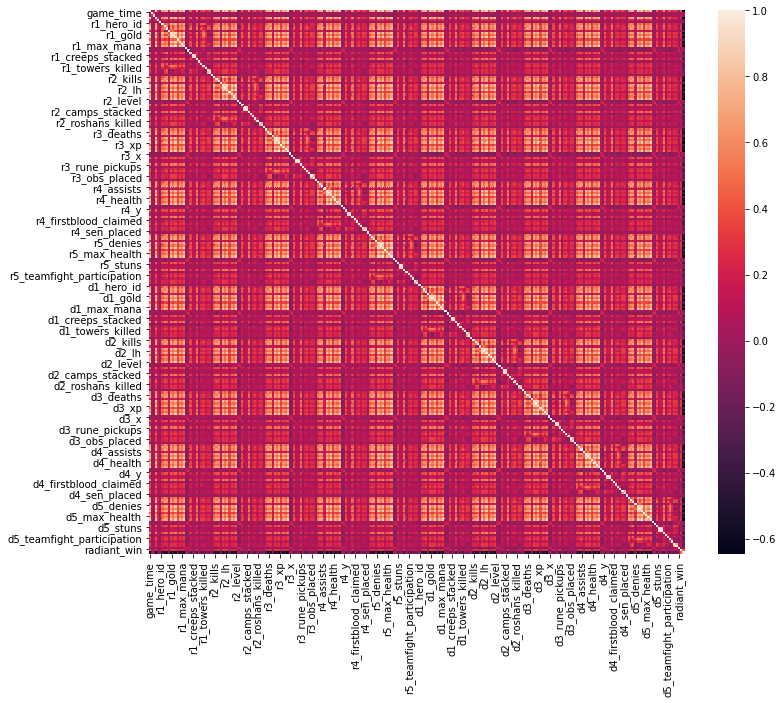

In [160]:
#heatmap of correlation coefficients
#repeating pattern is due to data set containing the same 24 values for each of the 10 heroes

plt.figure(figsize=(12, 10))
seaborn.heatmap(df.corr())

Correlation coefficients for radiant_win and Radiant player 1
game_time                    -0.025284
game_mode                    -0.000429
lobby_type                   -0.011445
objectives_len               -0.017575
chat_len                     -0.021564
r1_hero_id                    0.002505
r1_kills                      0.073036
r1_deaths                    -0.131602
r1_assists                    0.085740
r1_denies                     0.053929
r1_gold                       0.036184
r1_lh                         0.005787
r1_xp                         0.023841
r1_health                     0.056978
r1_max_health                 0.035663
r1_max_mana                   0.038702
r1_level                      0.020677
r1_x                          0.179728
r1_y                          0.214118
r1_stuns                      0.005925
r1_creeps_stacked             0.012365
r1_camps_stacked              0.011497
r1_rune_pickups               0.071540
r1_firstblood_claimed         0.020986
r1

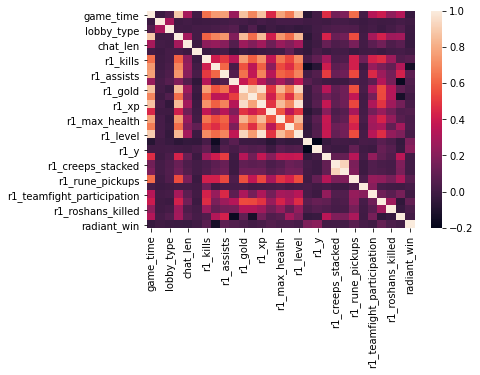

In [29]:
#correlation coefficients and heatmap for a single player
subDF = df.iloc[:,:29]
subDF.insert(29,'radiant_win', df['radiant_win'])
seaborn.heatmap(subDF.corr())
print("Correlation coefficients for radiant_win and Radiant player 1")
print(subDF.corr()['radiant_win'])

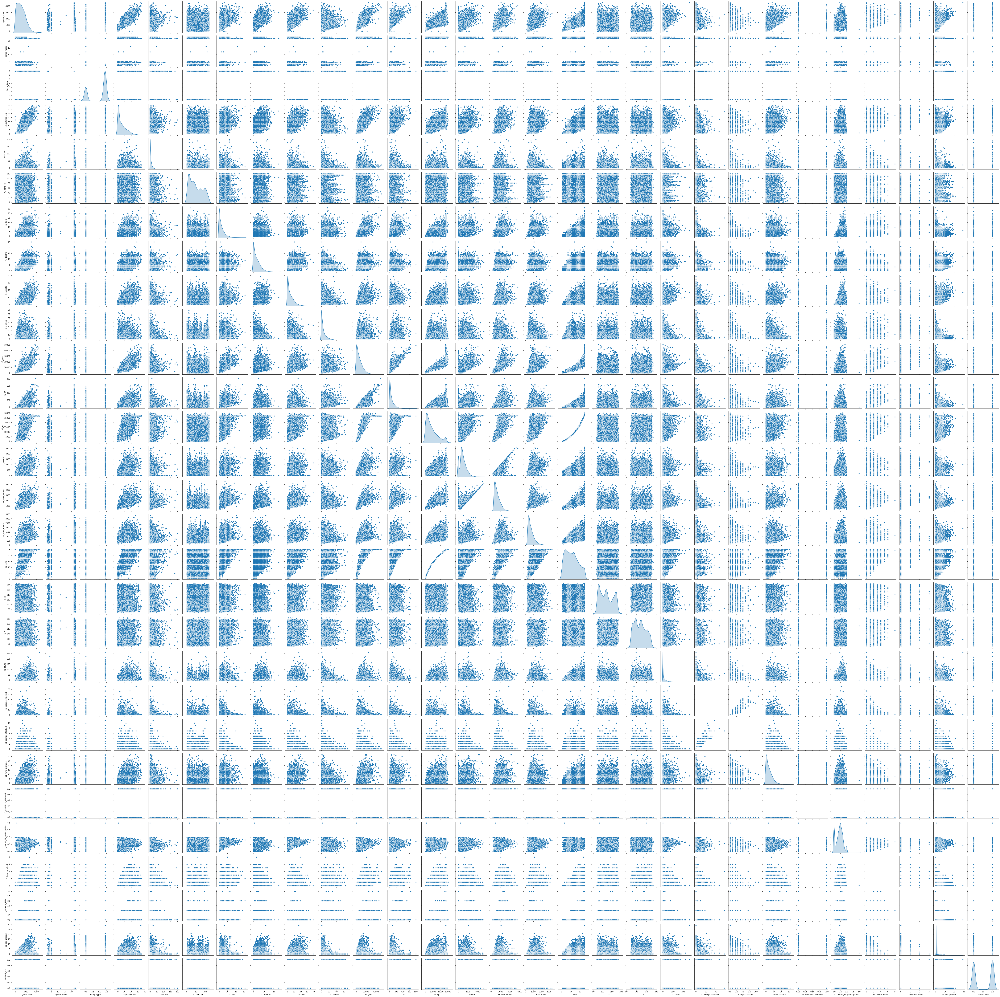

In [30]:
#Pair plot
seaborn.pairplot(subDF, diag_kind = 'kde')

In [58]:
#split data into training and test sets
#create and train random forest classifier on training data
label_data = df['radiant_win']
feature_data = df.drop('radiant_win', axis = 1)

x_train, x_test, y_train, y_test = train_test_split(feature_data, label_data, test_size = .2)
rf = RandomForestClassifier(max_depth =10)
rf.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [161]:
print (f'Random Forest score = {rf.score(x_test, y_test)}')

Random Forest score = 0.6829755366949576


In [162]:
#use Grid Search CV to find better hyperparameters for depth and max_features
#parameter lists are limited due to long processing time

from sklearn.model_selection import cross_val_score, GridSearchCV
#depth_params = [i for i in range(1, 20)]
#feature_params = [i for i in range(1,100, 5)]

depth_params = [2,4,6,8,10]
feature_params = [5,10,15,20,25]

params = {'max_depth': depth_params, 'max_features' : feature_params}
g = GridSearchCV(estimator = rf, param_grid = params, cv = 3)
g.fit(x_train, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=10,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random_

In [80]:
#show best hyperparameters and best score
print(g.best_params_)
print(g.best_score_)

{'max_depth': 10, 'max_features': 5}
0.6903387800068335


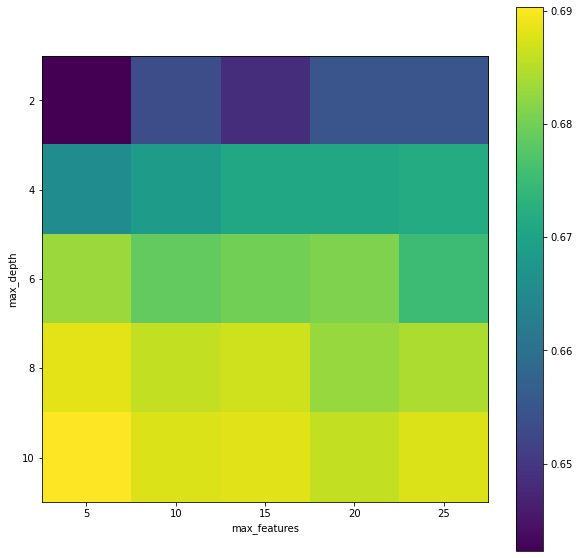

In [105]:
#hyperparameter heatmap
scores = [x for x in g.cv_results_["mean_test_score"]]
scores = np.array(scores).reshape(len(g.param_grid["max_depth"]), len(g.param_grid["max_features"]))

plt.figure(figsize=(10, 10))
plt.xticks(np.arange(len(g.param_grid["max_features"])), g.param_grid["max_features"])
plt.yticks(np.arange(len(g.param_grid["max_depth"])), g.param_grid["max_depth"])
plt.imshow(scores)
plt.ylabel('max_depth')
plt.xlabel('max_features')
plt.colorbar()
plt.show()

In [174]:
#use Grid Search CV to find better hyperparameters for n_estimators and min_impurity_decrease
#parameter lists are limited due to long processing time

estimators_params = [100,200,300,400,500]
impurity_params = [0,.01,.02,.03,.04]
params2 = {'n_estimators': estimators_params, 'min_impurity_decrease' : impurity_params}
g2 = GridSearchCV(estimator = rf, param_grid = params2, cv = 3)
g2.fit(x_train, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=10,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random_

In [175]:
#show best hyperparameters and best score
print(g2.best_params_)
print(g2.best_score_)

{'min_impurity_decrease': 0, 'n_estimators': 500}
0.6962049497282271


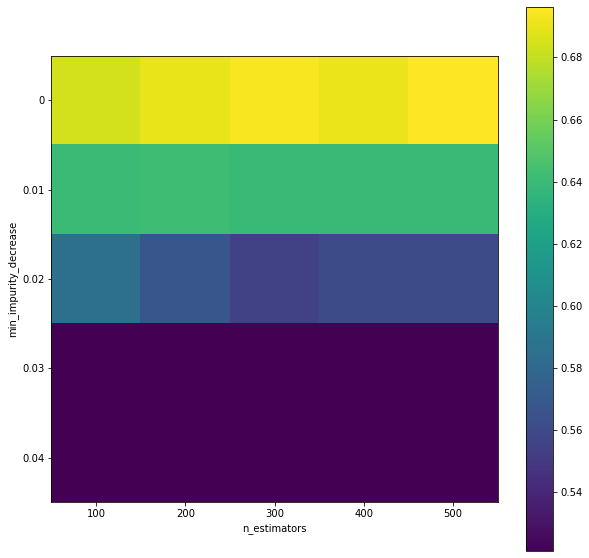

In [177]:
#hyperparameter heatmap
scores = [x for x in g2.cv_results_["mean_test_score"]]
scores = np.array(scores).reshape(len(g2.param_grid["n_estimators"]), len(g2.param_grid["min_impurity_decrease"]))

plt.figure(figsize=(10, 10))
plt.xticks(np.arange(len(g2.param_grid["n_estimators"])), g2.param_grid["n_estimators"])
plt.yticks(np.arange(len(g2.param_grid["min_impurity_decrease"])), g2.param_grid["min_impurity_decrease"])
plt.imshow(scores)
plt.xlabel('n_estimators')
plt.ylabel('min_impurity_decrease')
plt.colorbar()
plt.show()

In [191]:
#put best hyperparameters together and run classifier with test data
rf2 = RandomForestClassifier(max_depth =10, max_features = 5, min_impurity_decrease = 0, n_estimators = 500)
rf2.fit(x_train, y_train)

0.6989515726410385
[ 90 162 209  42  18]
Feature: r4_y, Importance: 0.014323262971837822
Feature: d2_y, Importance: 0.014364307954791567
Feature: d4_x, Importance: 0.01439320884943712
Feature: r2_y, Importance: 0.014987478248982946
Feature: r1_y, Importance: 0.015244009895314875


In [ ]:
print(rf2.score(x_test, y_test))

args = np.argsort(rf2.feature_importances_)[-5:]
#print (args)
for a in args:
    print(f'Feature: {df.columns[a]}, Importance: {rf2.feature_importances_[a]}')

Conclusion
The data was already clean and well formatted, so very little had to be done to get it ready for analysis. 

I chose a random forest classifier for several reasons: primarily because of its ability to easily handle categorial as well as numerical variables, but also because of its ability to handle outliers and noise. There were several downsides to this approach, however. Firstly, the longer training time meant I could not explore a wide range of hyperparameters using grid search. I think that, given more computing resources, the prediction accuracy could be increase at least into the mid 70s. The second drawback is that the results are less interpretable than, say, a logistic regression, so it's not easy to see which features are most important, although this would likely be a challenge regardless of the approach used due to the large number of features.

Based on the hyperparameter grid searches, it was clear that some features had a large impact on performance, while others had very little. min_impurity_decrease, for example, had a very large impact on performance, which decreased substantially as the parameter moved away from 0. Similarly, max_depth had a significant and positive impact on performance as it grew, and unlike min_impurity_decrease, it is not bounded by 0, so it is likely that there is room for improvement. max_features had a smaller, and somewhat ambiguous, impact on performance, which is to say that it did not uniformly increase or decrease accuracy as it grew. n_estimators had very little impact for the values tested, which probably indicates that 100 trees is "enough" to get a good model. 

Overall, the model achieved an accuracy of 0.6989, which is significantly better than chance, but leaves plenty to be improved upon. It seems like a reasonable success rate for a completely naive model, but I think significant improvements could only be achieved by incorporating some domain specific analysis, such as computing team-wide statistic or relative statistics that don't appear i